# Implementation of the *Price Reversal* Factor and *Accelerating Sales* Factor (as proposed by Andrew Lo and Pankaj Patel in "130/30: The New Long-Only")
By Vlad Obukhanich

Let's import all the necessary data for this implementation:

In [2]:
from quantopian.pipeline.data.builtin import USEquityPricing
from quantopian.pipeline.factors import CustomFactor
from quantopian.pipeline.classifiers.morningstar import Sector
from quantopian.pipeline.data import morningstar
from quantopian.pipeline import Pipeline
from quantopian.research import run_pipeline

import numpy as np
import pandas as pd
import alphalens
import alphalens.performance as perf 
import alphalens.utils as utils

## Price Reversal 
This factor is comprised of the following sub-factors:
- 5-Day Industry-Relative Return
- 5-Day Money Flow/Volume
- 4-Week Industry-Relative Return

### 5-Day Industry-Relative Return
Let's define a custom factor *FiveDayReturn* that will output the 5-day return for each stock in our selected universe of stocks (the sign of the return will be reversed because of the nature of this factor):

In [3]:
class FiveDayReturn(CustomFactor):  
    inputs = [USEquityPricing.close]
    window_length = 5
    
    def compute(self, today, assets, out, close):  
        out[:] = -1 * ((close[0]-close[-1]) / close[-1])

The industry-relative component of this factor will be taken care of by categorizing the stocks in our pipeline by their sector. This will be done by adding the Sector column to our pipeline that will contain Morningstar sector codes from the following dictionary:

In [4]:
MORNINGSTAR_SECTOR_CODES = {
     -1: 'Misc',
    101: 'Basic Materials',
    102: 'Consumer Cyclical',
    103: 'Financial Services',
    104: 'Real Estate',
    205: 'Consumer Defensive',
    206: 'Healthcare',
    207: 'Utilities',
    308: 'Communication Services',
    309: 'Energy',
    310: 'Industrials',
    311: 'Technology' ,    
}

Create a temporary pipeline and add the *FiveDayReturn* factor to it:

In [5]:
temp_pipe_1 = Pipeline(
    columns={
        'FiveDayReturn': FiveDayReturn(),
        'Sector': Sector(),
    }
)

Run the pipeline and get data for the first 5 stocks:

In [6]:
run_pipeline(temp_pipe_1, start_date='2017-08-18', end_date='2017-08-18').head()

FiveDayReturn  Sector
2017-08-18 00:00:00+00:00 Equity(2 [ARNC])           0.011944     310
                          Equity(21 [AAME])          0.014493     103
                          Equity(24 [AAPL])          0.002470     311
                          Equity(25 [ARNC_PR])            NaN     101
                          Equity(31 [ABAX])          0.023231     206

### 5-Day Money Flow/Volume
Let's define a custom factor *FiveDayMoneyFlowVol* that will output the closing price times the volume over the absolute value of the closing price times the volume for the past 5 days for each stock in our selected universe of stocks:

In [7]:
class FiveDayMoneyFlowVol(CustomFactor):  
    inputs = [USEquityPricing.close, USEquityPricing.volume]
    window_length = 5
    
    def compute(self, today, assets, out, close, vol):
        out[:] = (close[0] * vol[0]) / abs(close[0] * vol[-4])

Create a temporary pipeline and add the *FiveDayMoneyFlowVol* factor to it:

In [8]:
temp_pipe_2 = Pipeline(
    columns={
        'FiveDayMoneyFlowVol': FiveDayMoneyFlowVol(),
    }
)

Run the pipeline and get data for the first 5 stocks:

In [9]:
run_pipeline(temp_pipe_2, start_date='2017-08-18', end_date='2017-08-18').head()

FiveDayMoneyFlowVol
2017-08-18 00:00:00+00:00 Equity(2 [ARNC])                 1.148711
                          Equity(21 [AAME])                0.600000
                          Equity(24 [AAPL])                1.233850
                          Equity(25 [ARNC_PR])                  NaN
                          Equity(31 [ABAX])                1.573430

### 4-Week Industry-Relative Return
Let's define a custom factor *FourWeekReturn* that will output the 4-week return for each stock in our selected universe of stocks: (Again, the sign of the return will be reversed.)

In [10]:
class FourWeekReturn(CustomFactor):  
    inputs = [USEquityPricing.close]
    window_length = 20
    
    def compute(self, today, assets, out, close):  
        out[:] = -1 * ((close[0]-close[-1]) / close[-1])

As usual, the industry-relative component of this factor will be taken care of by categorizing the stocks in our pipeline by their sector with the help of the Morningstar dictionary.

Now, let's create a temporary pipeline and add the *FourWeekReturn* factor to it:

In [11]:
temp_pipe_3 = Pipeline(
    columns={
        'FourWeekReturn': FourWeekReturn(),
        'Sector': Sector(),
    }
)

Run the pipeline and get data for the first 5 stocks:

In [12]:
run_pipeline(temp_pipe_3, start_date='2017-08-18', end_date='2017-08-18').head()

FourWeekReturn  Sector
2017-08-18 00:00:00+00:00 Equity(2 [ARNC])           -0.035410     310
                          Equity(21 [AAME])          -0.043478     103
                          Equity(24 [AAPL])           0.051860     311
                          Equity(25 [ARNC_PR])             NaN     101
                          Equity(31 [ABAX])          -0.070322     206

### Create Full Pipeline
Now, let's incorporate all the sub-factors of the *Price Reversal* factor in one pipeline. Let us also define another custom factor *SPYProxy* that will create an approximate S&P 500 by outputting the 500 US Equities with the greatest market capitalizations:

In [13]:
# This factor creates the synthetic S&P 500.
class SPYProxy(CustomFactor):
    inputs = [morningstar.valuation.market_cap]
    window_length = 1
    
    def compute(self, today, assets, out, mc):
        out[:] = mc[-1]

full_pipeline_1 = Pipeline(
    columns={
        'SPYProxy': SPYProxy(),
        'FiveDayReturn': FiveDayReturn(),
        'FiveDayMoneyFlowVol': FiveDayMoneyFlowVol(),
        'FourWeekReturn': FourWeekReturn(),
        'Sector': Sector(),
    }
)

results_1 = run_pipeline(full_pipeline_1, start_date='2016-08-18', end_date='2017-08-18')
results_1.head()

FiveDayMoneyFlowVol  \
2016-08-18 00:00:00+00:00 Equity(2 [ARNC])                 0.690695   
                          Equity(21 [AAME])                     inf   
                          Equity(24 [AAPL])                1.207420   
                          Equity(25 [ARNC_PR])             1.430000   
                          Equity(31 [ABAX])                1.537423   

                                                FiveDayReturn  FourWeekReturn  \
2016-08-18 00:00:00+00:00 Equity(2 [ARNC])          -0.005309       -0.019709   
                          Equity(21 [AAME])               NaN             NaN   
                          Equity(24 [AAPL])          0.011630        0.094465   
                          Equity(25 [ARNC_PR])       0.002645        0.011737   
                          Equity(31 [ABAX])         -0.013872       -0.116687   

                                                    SPYProxy  Sector  
2016-08-18 00:00:00+00:00 Equity(2 [ARNC])      1.362730e+10     101  
                          Equity(21 [AAME])     7.678260e+07     103  
                          Equity(24 [AAPL])     5.885260e+11     311  
                          Equity(25 [ARNC_PR])           NaN     101  
                          Equity(31 [ABAX])     1.104570e+09     206

### Test in Alphalens
Now that we have the full pipeline with each of the *Price Reversal* sub-factors in it, let's create an Alphalens factor tear sheet for each one of them:

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-11.857143,0.001138,-0.061012,0.106406,357359,20.008712
2,-0.058375,0.016982,-0.009921,0.010442,357733,20.029653
3,-0.036872,0.040430,0.001391,0.008681,357007,19.989003
4,-0.023345,0.096726,0.012088,0.011825,356700,19.971814
5,-0.006228,1.161301,0.052348,0.051558,357218,20.000817


Returns Analysis


,1,5,10
Ann. alpha,-0.042,-0.040,0.027
beta,-0.074,-0.270,-0.260
Mean Period Wise Return Top Quantile (bps),-0.007,-7.416,-6.995
Mean Period Wise Return Bottom Quantile (bps),-2.188,0.736,0.400
Mean Period Wise Spread (bps),2.227,-1.585,-0.691


/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:727: FutureWarning: pd.rolling_apply is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,min_periods=1,window=5).apply(args=<tuple>,func=<function>,kwargs=<dict>)
  min_periods=1, args=(period,))
/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:767: FutureWarning: pd.rolling_apply is deprecated for DataFrame and will be removed in a future version, replace with 
	DataFrame.rolling(center=False,min_periods=1,window=5).apply(args=<tuple>,func=<function>,kwargs=<dict>)
  min_periods=1, args=(period,))
/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:727: FutureWarning: pd.rolling_apply is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,min_periods=1,window=10).apply(args=<tuple>,func=<function>,kwargs=<dict>)
  min_periods=1, args=(period,))
/usr/local/lib/python2.7/dist-packages/alphalens/pl

Information Analysis


,1,5,10
IC Mean,-0.001,-0.011,-0.014
IC Std.,0.098,0.102,0.094
t-stat(IC),-0.088,-1.753,-2.387
p-value(IC),0.930,0.081,0.018
IC Skew,0.368,-0.242,0.086
IC Kurtosis,1.565,0.959,0.994
Ann. IR,-0.090,-1.785,-2.431


/usr/local/lib/python2.7/dist-packages/alphalens/plotting.py:215: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=22,center=False).mean()
  pd.rolling_mean(ic, 22).plot(ax=a,


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.367,0.709,0.711
Quantile 2 Mean Turnover,0.600,0.793,0.787
Quantile 3 Mean Turnover,0.613,0.712,0.719
Quantile 4 Mean Turnover,0.599,0.779,0.776
Quantile 5 Mean Turnover,0.381,0.746,0.746


,1,5,10
Mean Factor Rank Autocorrelation,0.662,-0.011,0.0


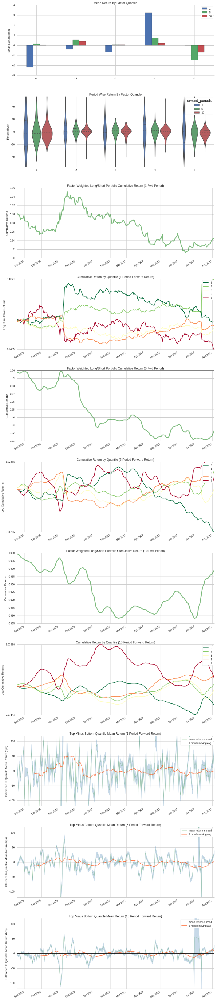

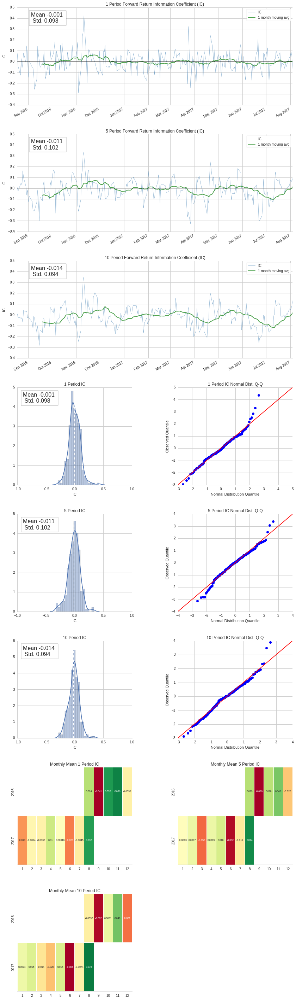

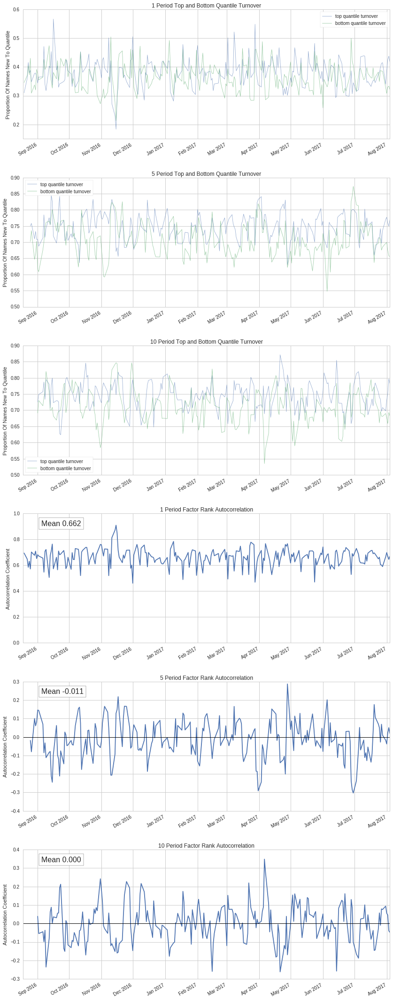

In [14]:
assets = results_1.index.levels[1].unique()  
pricing = get_pricing(assets, '2016-08-18', '2017-08-18', fields='open_price')

# Test FiveDayReturn.
factor_data_1 = alphalens.utils.get_clean_factor_and_forward_returns(results_1['FiveDayReturn'],
                                                                     pricing,
                                                                     quantiles=5,
                                                                     groupby=results_1['Sector'],
                                                                     periods=(1,5,10))

alphalens.tears.create_full_tear_sheet(factor_data_1)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-1.420050,1.345203,0.378206,0.174294,360422,20.005517
2,0.239811,2.031455,0.755776,0.138270,360278,19.997524
3,0.369147,2.811992,1.037163,0.175367,360274,19.997302
4,0.509594,4.406655,1.422944,0.264880,360275,19.997358
5,0.772759,inf,inf,NaN,360364,20.002298


Returns Analysis


,1,5,10
Ann. alpha,NaN,NaN,NaN
beta,NaN,NaN,NaN
Mean Period Wise Return Top Quantile (bps),1.270,4.390,7.996
Mean Period Wise Return Bottom Quantile (bps),3.051,4.339,10.355
Mean Period Wise Spread (bps),-1.786,0.006,-0.233


Information Analysis


,1,5,10
IC Mean,-0.004,-0.003,-0.002
IC Std.,0.026,0.025,0.024
t-stat(IC),-2.086,-2.121,-1.448
p-value(IC),0.038,0.035,0.149
IC Skew,-0.380,-0.087,-0.046
IC Kurtosis,3.272,0.523,3.316
Ann. IR,-2.125,-2.160,-1.475


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.896,0.769,0.773
Quantile 2 Mean Turnover,0.818,0.784,0.784
Quantile 3 Mean Turnover,0.741,0.767,0.768
Quantile 4 Mean Turnover,0.824,0.783,0.783
Quantile 5 Mean Turnover,0.892,0.769,0.764


,1,5,10
Mean Factor Rank Autocorrelation,-0.369,0.003,0.005


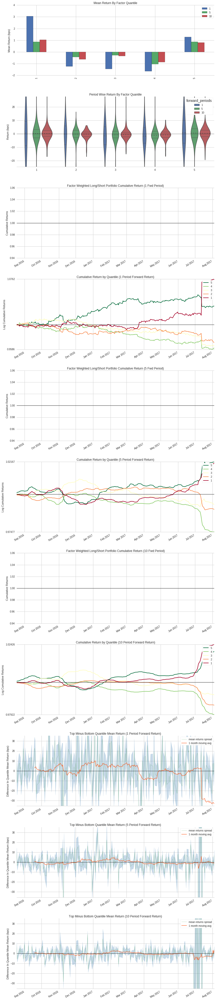

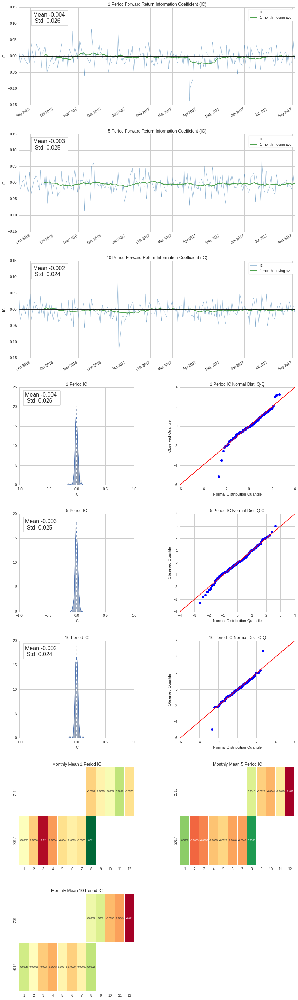

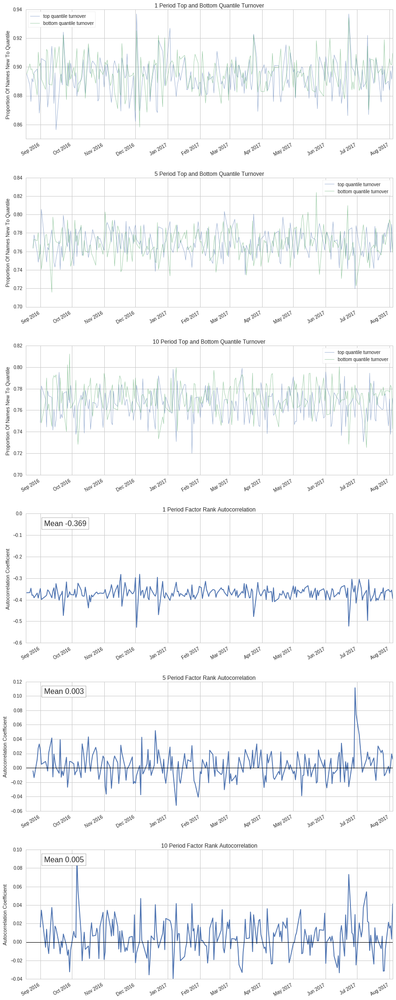

In [15]:
# Test FiveDayMoneyFlowVol.
factor_data_2 = alphalens.utils.get_clean_factor_and_forward_returns(results_1['FiveDayMoneyFlowVol'],
                                                                   pricing,
                                                                   quantiles=5,
                                                                   groupby=results_1['Sector'],
                                                                   periods=(1,5,10))

alphalens.tears.create_full_tear_sheet(factor_data_2)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-49.000000,-0.008621,-0.154289,0.344943,355343,20.005686
2,-0.127344,0.023026,-0.018591,0.019121,355197,19.997467
3,-0.056618,0.070588,0.006959,0.014782,355217,19.998593
4,-0.027261,0.144930,0.031563,0.022308,355169,19.995890
5,0.000974,1.245536,0.114108,0.084239,355284,20.002365


Returns Analysis


,1,5,10
Ann. alpha,-0.206,-0.026,0.055
beta,-0.172,-0.484,-0.630
Mean Period Wise Return Top Quantile (bps),2.711,6.720,8.729
Mean Period Wise Return Bottom Quantile (bps),2.225,5.890,5.388
Mean Period Wise Spread (bps),0.460,0.166,0.357


Information Analysis


,1,5,10
IC Mean,0.001,-0.009,-0.016
IC Std.,0.089,0.103,0.107
t-stat(IC),0.248,-1.376,-2.292
p-value(IC),0.804,0.170,0.023
IC Skew,-0.211,-0.298,-0.179
IC Kurtosis,-0.016,-0.100,-0.156
Ann. IR,0.253,-1.401,-2.334


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.170,0.363,0.512
Quantile 2 Mean Turnover,0.375,0.604,0.705
Quantile 3 Mean Turnover,0.415,0.606,0.675
Quantile 4 Mean Turnover,0.372,0.601,0.697
Quantile 5 Mean Turnover,0.176,0.380,0.538


,1,5,10
Mean Factor Rank Autocorrelation,0.911,0.655,0.399


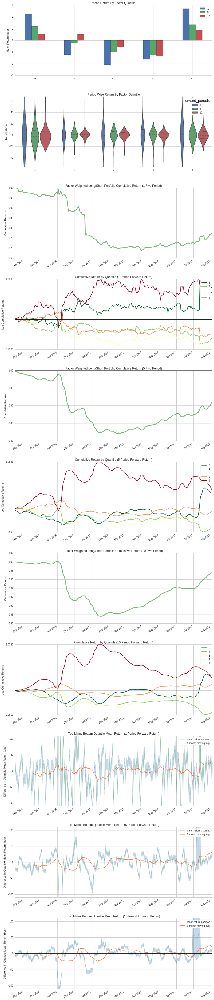

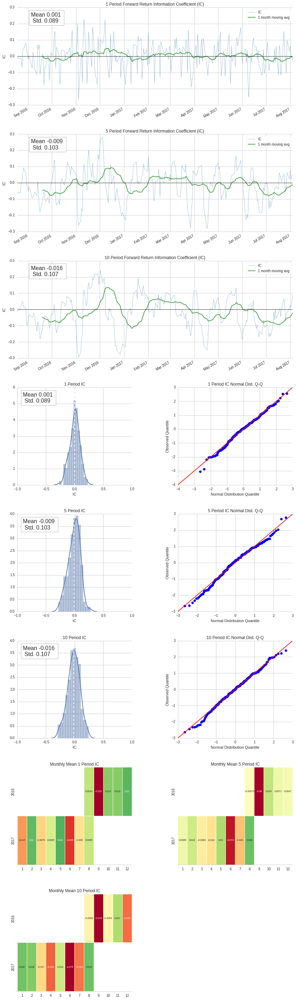

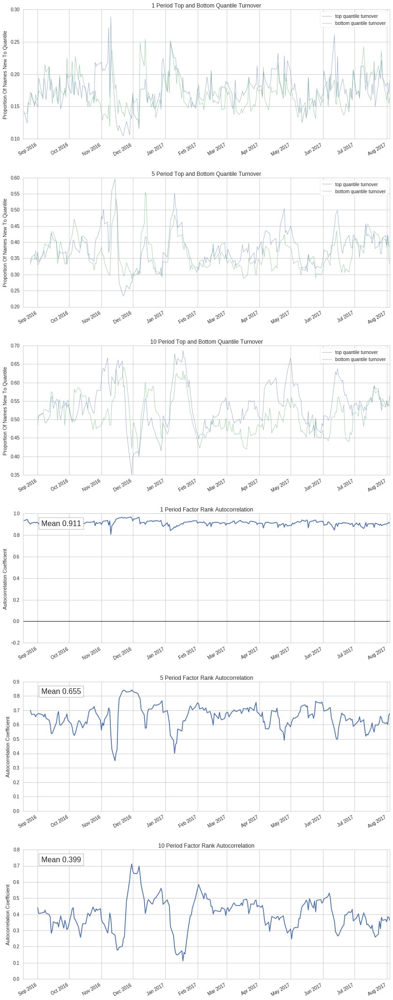

In [16]:
# Test FourWeekReturn.
factor_data_3 = alphalens.utils.get_clean_factor_and_forward_returns(results_1['FourWeekReturn'],
                                                                   pricing,
                                                                   quantiles=5,
                                                                   groupby=results_1['Sector'],
                                                                   periods=(1,5,10))

alphalens.tears.create_full_tear_sheet(factor_data_3)

## Accelerating Sales
This factor is comprised of the following sub-factors:
- 3-Month Momentum in Trailing 12-Month Sales
- 6-Month Momentum in Trailing 12-Month Sales
- Change in Slope of 4-Quarter Trendline through Quarterly Sales

In [17]:
class ThreeMonthTTMSales(CustomFactor):
    inputs = [morningstar.income_statement.total_revenue]
    window_length = 252
    
    def compute(self, today, assets, out, rev):
        out[:] = rev[-63] + rev[-1] - rev[-252]
        
class SixMonthTTMSales(CustomFactor):
    inputs = [morningstar.income_statement.total_revenue]
    window_length = 252
    
    def compute(self, today, assets, out, rev):
        out[:] = rev[-126] + rev[-1] - rev[-252]
        
class ChangeInQuarterlySales(CustomFactor):
    inputs = [morningstar.income_statement.total_revenue]
    window_length = 252
    
    def compute(self, today, assets, out, rev):
        out[:] = (rev[-1]-rev[-252]) / rev[-252]

### Create Full Pipeline
Let's incorporate all the sub-factors of the *Accelerating Sales* factor in one pipeline:

In [18]:
full_pipeline_2 = Pipeline(
    columns={
        'SPYProxy': SPYProxy(),
        'ThreeMonthTTMSales': ThreeMonthTTMSales(),
        'SixMonthTTMSales': SixMonthTTMSales(),
        'ChangeInQuarterlySales': ChangeInQuarterlySales(),
        'Sector': Sector(),
    }
)

results_2 = run_pipeline(full_pipeline_2, start_date='2016-08-18', end_date='2017-08-18')
results_2.head()

ChangeInQuarterlySales  \
2016-08-18 00:00:00+00:00 Equity(2 [ARNC])                   -0.102086   
                          Equity(21 [AAME])                  -0.065175   
                          Equity(24 [AAPL])                  -0.146094   
                          Equity(25 [ARNC_PR])               -0.102086   
                          Equity(31 [ABAX])                   0.086758   

                                                    SPYProxy  Sector  \
2016-08-18 00:00:00+00:00 Equity(2 [ARNC])      1.362730e+10     101   
                          Equity(21 [AAME])     7.678260e+07     103   
                          Equity(24 [AAPL])     5.885260e+11     311   
                          Equity(25 [ARNC_PR])           NaN     101   
                          Equity(31 [ABAX])     1.104570e+09     206   

                                                SixMonthTTMSales  \
2016-08-18 00:00:00+00:00 Equity(2 [ARNC])          4.643000e+09   
                          Equity(21 [AAME])         3.744100e+07   
                          Equity(24 [AAPL])         6.862500e+10   
                          Equity(25 [ARNC_PR])      4.643000e+09   
                          Equity(31 [ABAX])         5.748200e+07   

                                                ThreeMonthTTMSales  
2016-08-18 00:00:00+00:00 Equity(2 [ARNC])            4.345000e+09  
                          Equity(21 [AAME])           3.882900e+07  
                          Equity(24 [AAPL])           4.331000e+10  
                          Equity(25 [ARNC_PR])        4.345000e+09  
                          Equity(31 [ABAX])           6.156600e+07

### Test in Alphalens
Lastly, let's create an Alphalens factor tear sheet for each one of them:

In [19]:
assets = results_2.index.levels[1].unique()  
pricing = get_pricing(assets, '2016-08-18', '2017-08-18', fields='open_price')

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-3.401430e+10,1.442486e+07,-3.248216e+07,5.573671e+08,220012,20.008931
2,1.172162e+07,7.797900e+07,3.553663e+07,1.646545e+07,219882,19.997108
3,6.427700e+07,2.581590e+08,1.350633e+08,4.690707e+07,219886,19.997472
4,2.071000e+08,9.199260e+08,4.502875e+08,1.706564e+08,219865,19.995562
5,7.396600e+08,7.889072e+12,6.402071e+09,6.838565e+10,219924,20.000928


Returns Analysis


,1,5,10
Ann. alpha,-0.003,0.022,0.033
beta,-0.280,-0.323,-0.344
Mean Period Wise Return Top Quantile (bps),-3.403,-5.470,-7.125
Mean Period Wise Return Bottom Quantile (bps),-1.854,-16.545,-40.765
Mean Period Wise Spread (bps),-1.512,2.346,3.517


Information Analysis


,1,5,10
IC Mean,0.028,0.044,0.049
IC Std.,0.074,0.078,0.079
t-stat(IC),5.844,8.773,9.689
p-value(IC),0.000,0.000,0.000
IC Skew,-0.034,-0.431,-0.457
IC Kurtosis,-0.372,0.357,-0.127
Ann. IR,5.951,8.934,9.866


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.040,0.041,0.062
Quantile 2 Mean Turnover,0.030,0.037,0.057
Quantile 3 Mean Turnover,0.022,0.032,0.050
Quantile 4 Mean Turnover,0.015,0.024,0.038
Quantile 5 Mean Turnover,0.009,0.012,0.019


,1,5,10
Mean Factor Rank Autocorrelation,0.999,0.997,0.994


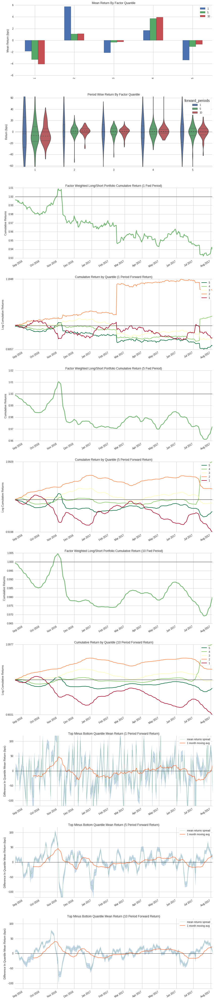

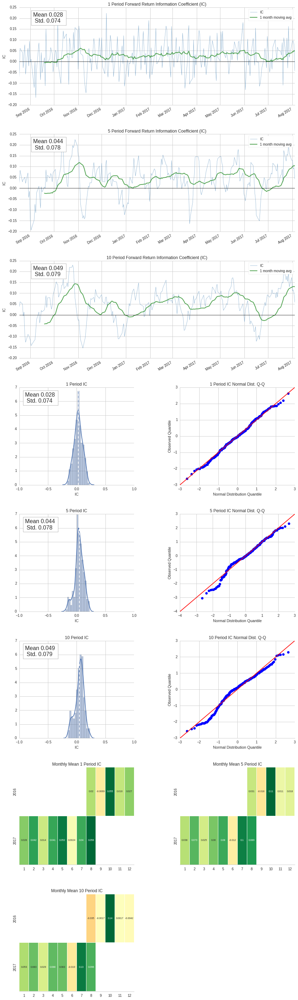

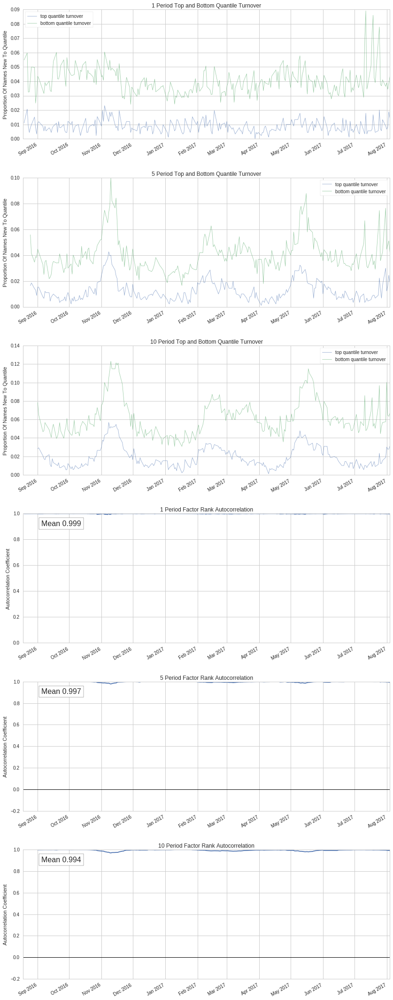

In [20]:
# Test ThreeMonthTTMSales.
factor_data_4 = alphalens.utils.get_clean_factor_and_forward_returns(results_2['ThreeMonthTTMSales'],
                                                                     pricing,
                                                                     quantiles=5,
                                                                     groupby=results_1['Sector'],
                                                                     periods=(1,5,10))

alphalens.tears.create_full_tear_sheet(factor_data_4)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-3.401870e+10,1.468900e+07,-2.650882e+07,4.843145e+08,220028,20.010295
2,1.177800e+07,7.831900e+07,3.588786e+07,1.639088e+07,219863,19.995289
3,6.540300e+07,2.537000e+08,1.341106e+08,4.574341e+07,219873,19.996199
4,2.119100e+08,9.100950e+08,4.446548e+08,1.677049e+08,219884,19.997199
5,7.549000e+08,1.565491e+13,6.106386e+09,6.396770e+10,219926,20.001019


Returns Analysis


,1,5,10
Ann. alpha,-0.004,0.024,0.031
beta,-0.288,-0.325,-0.343
Mean Period Wise Return Top Quantile (bps),-3.518,-6.175,-8.421
Mean Period Wise Return Bottom Quantile (bps),-1.436,-14.901,-37.864
Mean Period Wise Spread (bps),-2.050,1.879,3.102


Information Analysis


,1,5,10
IC Mean,0.027,0.043,0.049
IC Std.,0.074,0.078,0.080
t-stat(IC),5.756,8.641,9.504
p-value(IC),0.000,0.000,0.000
IC Skew,-0.015,-0.489,-0.533
IC Kurtosis,-0.345,0.311,-0.163
Ann. IR,5.862,8.800,9.678


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.041,0.042,0.064
Quantile 2 Mean Turnover,0.030,0.039,0.060
Quantile 3 Mean Turnover,0.022,0.033,0.051
Quantile 4 Mean Turnover,0.015,0.025,0.039
Quantile 5 Mean Turnover,0.009,0.013,0.020


,1,5,10
Mean Factor Rank Autocorrelation,0.999,0.996,0.993


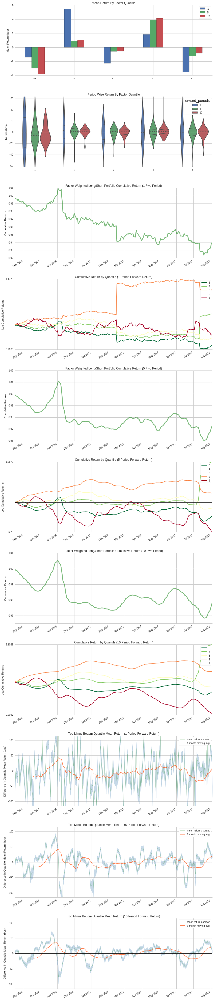

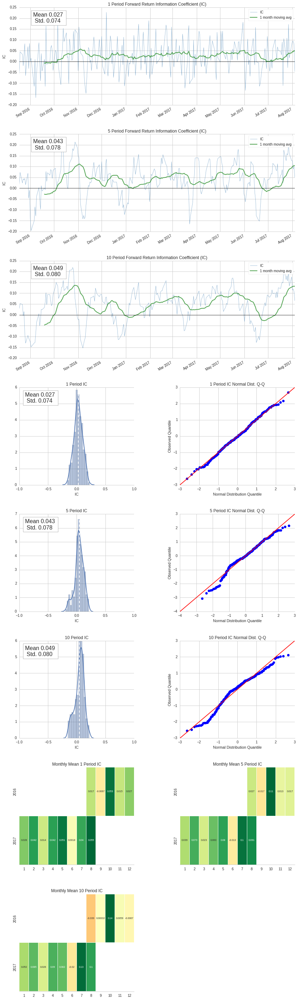

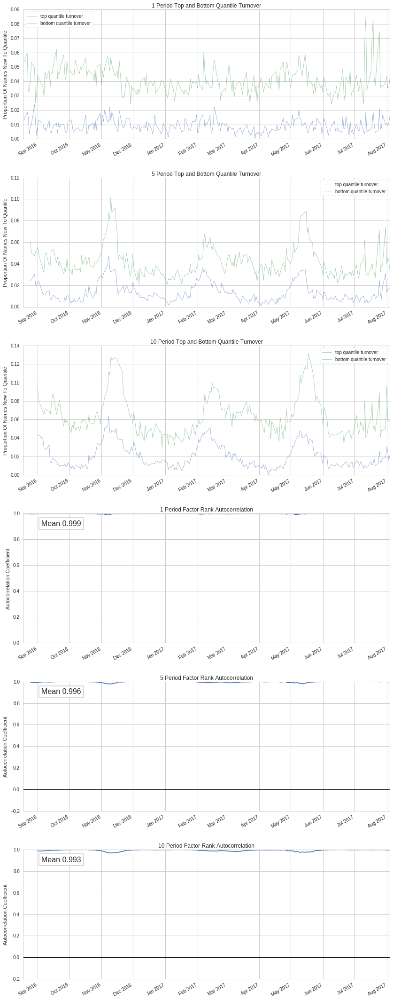

In [21]:
# Test SixMonthTTMSales.
factor_data_5 = alphalens.utils.get_clean_factor_and_forward_returns(results_2['SixMonthTTMSales'],
                                                                     pricing,
                                                                     quantiles=5,
                                                                     groupby=results_1['Sector'],
                                                                     periods=(1,5,10))

alphalens.tears.create_full_tear_sheet(factor_data_5)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-44.621495,-0.054725,-0.398967,0.988371,213100,20.011363
2,-0.123259,0.029757,-0.030891,0.031674,213036,20.005353
3,-0.006233,0.098914,0.042250,0.021930,213032,20.004977
4,0.061298,0.256610,0.133636,0.042545,212759,19.979341
5,0.192824,inf,inf,NaN,212968,19.998967


Returns Analysis


,1,5,10
Ann. alpha,NaN,NaN,NaN
beta,NaN,NaN,NaN
Mean Period Wise Return Top Quantile (bps),-0.320,0.398,1.061
Mean Period Wise Return Bottom Quantile (bps),-4.127,-17.193,-40.099
Mean Period Wise Spread (bps),3.835,3.567,4.174


Information Analysis


,1,5,10
IC Mean,0.015,0.025,0.032
IC Std.,0.049,0.049,0.053
t-stat(IC),4.760,8.116,9.475
p-value(IC),0.000,0.000,0.000
IC Skew,-0.304,-0.502,-0.501
IC Kurtosis,0.057,0.152,-0.160
Ann. IR,4.847,8.265,9.649


Turnover Analysis


,1,5,10
Quantile 1 Mean Turnover,0.025,0.052,0.085
Quantile 2 Mean Turnover,0.039,0.078,0.125
Quantile 3 Mean Turnover,0.038,0.080,0.129
Quantile 4 Mean Turnover,0.035,0.075,0.121
Quantile 5 Mean Turnover,0.023,0.049,0.082


,1,5,10
Mean Factor Rank Autocorrelation,0.991,0.964,0.936


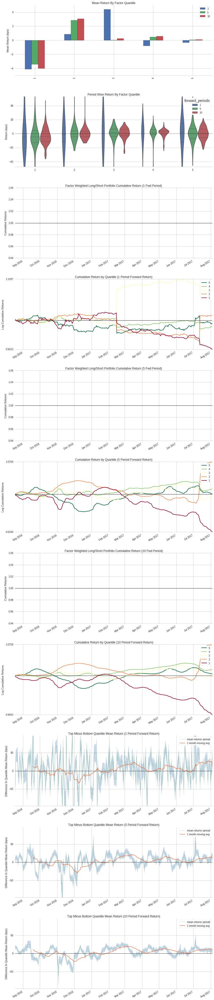

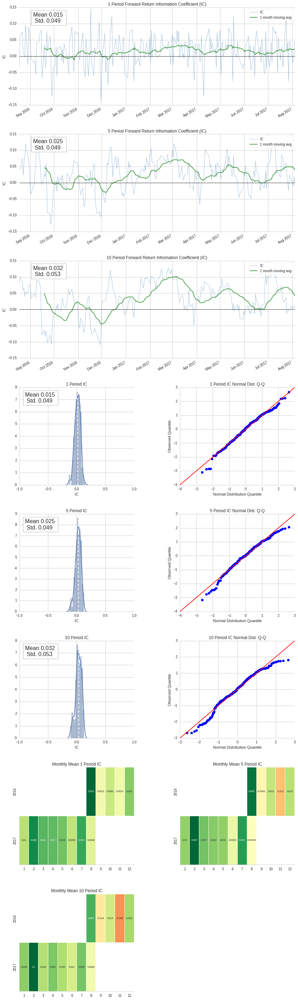

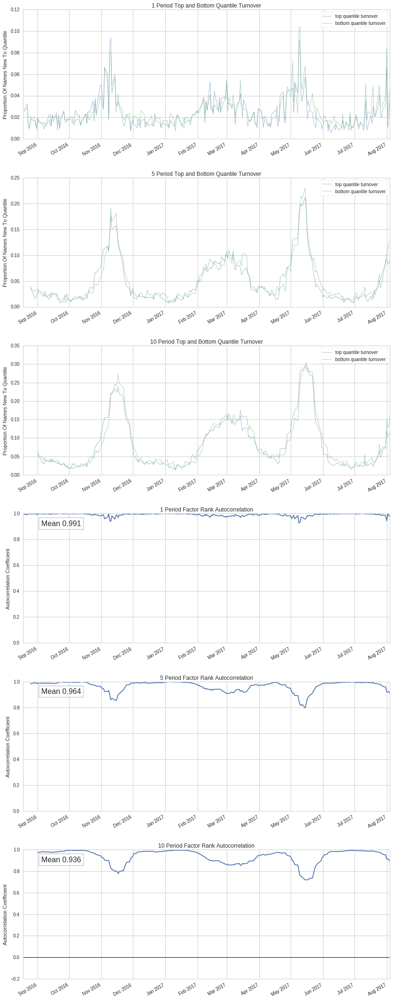

In [22]:
# Test ChangeInQuarterlySales.
factor_data_6 = alphalens.utils.get_clean_factor_and_forward_returns(results_2['ChangeInQuarterlySales'],
                                                                     pricing,
                                                                     quantiles=5,
                                                                     groupby=results_1['Sector'],
                                                                     periods=(1,5,10))

alphalens.tears.create_full_tear_sheet(factor_data_6)